In [1]:
"""
My Base Model of HousingPrices Prediction Task
Author: Walter Yoda
Date:12/02/16
"""
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'png' #set 'png' here when working on notebook
%matplotlib inline

In [2]:
#read data from csv file
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [3]:
# y Labels
label = train['SalePrice']
# X features
features = train.drop(['SalePrice'], axis =1)

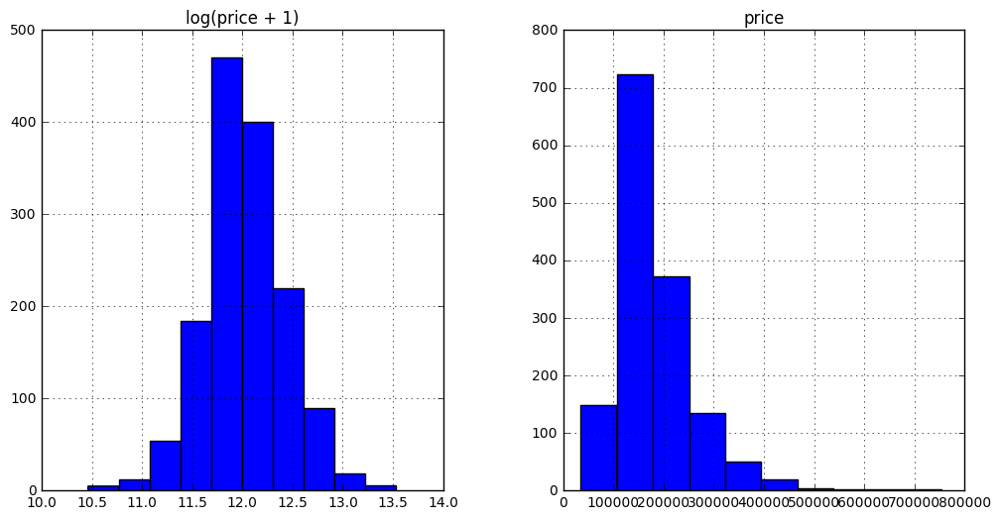

In [4]:
#numeric_features = features._get_numeric_data()
# log transform for label data.
matplotlib.rcParams['figure.figsize'] = (12.0, 6.0)
prices = pd.DataFrame({"log(price + 1)":np.log1p(label), "price":label})
prices.hist()
log_label = np.log1p(label)

In [5]:
from scipy.stats import skew
import pylab
# The Base model only using numeric data
# before we build the Base Model , we should also doing log transform for the features data
numeric_feats = features.dtypes[features.dtypes != "object"].index
skewed_feats = features[numeric_feats].apply(lambda x: skew(x.dropna()))
skewed_feats = skewed_feats[skewed_feats > 0.75]
skewed_feats = skewed_feats.index
log_features = features
log_features[skewed_feats] = np.log1p(features[skewed_feats])
numeric_log_features = log_features._get_numeric_data()
print(numeric_log_features.shape)

(1460, 37)


In [6]:
# fill None data by using mean data
numeric_log_features = numeric_log_features.fillna(numeric_log_features.mean())

In [38]:
pylab.clf()
axs = pd.scatter_matrix(numeric_log_features, alpha = 0.3, figsize = (140,80), diagonal = 'kde');
pylab.savefig("res.png")

In [8]:
# dataframe types
features.dtypes

Id                 int64
MSSubClass       float64
MSZoning          object
LotFrontage      float64
LotArea          float64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
                  ...   
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr     float64
KitchenQual       object
TotRmsAbvGrd       int64
Functional        object
Fireplaces         int64
FireplaceQu       object
GarageType        object


In [9]:
numeric_log_features.dtypes

Id                 int64
MSSubClass       float64
LotFrontage      float64
LotArea          float64
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
MasVnrArea       float64
BsmtFinSF1       float64
BsmtFinSF2       float64
BsmtUnfSF        float64
TotalBsmtSF      float64
1stFlrSF         float64
2ndFlrSF         float64
LowQualFinSF     float64
GrLivArea        float64
BsmtFullBath       int64
BsmtHalfBath     float64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr     float64
TotRmsAbvGrd       int64
Fireplaces         int64
GarageYrBlt      float64
GarageCars         int64
GarageArea         int64
WoodDeckSF       float64
OpenPorchSF      float64
EnclosedPorch    float64
3SsnPorch        float64
ScreenPorch      float64
PoolArea         float64
MiscVal          float64
MoSold             int64
YrSold             int64
dtype: object

In [23]:
# regression explorer, 36 features within one single label
explorer_data = ['Id','MSSubClass','LotFrontage','LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','MoSold','YrSold']
explorer_log_label = log_label
from sklearn.cross_validation import train_test_split
# TODO：使用给定的特征作为目标，将数据分割成训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(numeric_log_features, explorer_log_label, test_size = 0.25, random_state = 42)
from sklearn.tree import DecisionTreeRegressor
# TODO：创建一个决策树回归器并在训练集上训练它
regressor = DecisionTreeRegressor(random_state = 42)
regressor.fit(X_train, y_train)
# TODO：输出在测试集上的预测得分
score = regressor.score(X_test, y_test)
print(score)

0.690950875818


In [ ]:
# other regression explorer, drop one single feature as label to see the output score